<center> <img src="https://miro.medium.com/v2/resize:fit:300/0*gTbWMTKvNF-jLJrM.jpg" width=30% > </center>

<br><br>

<center> 
    <font size="6">Lab 3: Corner Detection, Optical Flow and Feature Tracking</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 26, 2025 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>PhD TA: Dimitrije Antić</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 14633485 \
Student1 Name: David van Batenburg

Student2 ID: 16195965\
Student2 Name: Samuele Punzo

Student3 ID: 16334523 \
Student3 Name: Edoardo Vergnano

Student4 ID: 16217632 \
Student4 Name: Seyedeh Zahra Ahmadi

</center>

### **Import Libraries**

In [2]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [3]:
# environment and libraries
import os
import math
import numpy as np
import time
import cv2
import matplotlib
import matplotlib.pyplot as plt
import sklearn
import scipy.signal
import pandas as pd
import torch

from tqdm import tqdm

from scipy.ndimage import maximum_filter, gaussian_filter

import torchvision.transforms.functional as F
from torchvision.io import read_video
from torchvision.models.optical_flow import Raft_Large_Weights, Raft_Small_Weights, raft_large, raft_small
from torchvision.utils import flow_to_image
from pathlib import Path
from IPython.display import clear_output, display, Video

In [4]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 3 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=CV1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Harris Corner Detector (24 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (3 points)](#question-2)
  - [Question 3 (3 points)](#question-3)
  - [Question 4 (7 points)](#question-4)
  - [Question 5 (2 points)](#question-5)
  - [Question 6 (2 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 2: Good Features to Track (Shi & Tomasi) (10 points)](#section-2)
  - [Question 9 (3 points)](#question-9)
  - [Question 10 (4 points)](#question-10)
  - [Question 11 (3 points)](#question-11)
- [Section 3: Optical Flow and Lucas-Kanade Method (28 points)](#section-3)
  - [Question 12 (20 points)](#question-12)
  - [Question 13 (4 points)](#question-13)
  - [Question 14 (4 points)](#question-14)
- [Section 4: Feature Tracking (23 points)](#section-4)
  - [Question 15 (17 points)](#question-15)
  - [Question 16 (6 points)](#question-16)
- [Section 5: Optical Flow with RAFT Model (15 points)](#section-5)
  - [Question 17 (3 points)](#question-17)
  - [Question 18 (3 points)](#question-18)
  - [Question 19 (3 points)](#question-19)
  - [Question 20 (3 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Harris Corner Detector**

In this section, a derivation of the [Harris Corner Detector](https://www.semanticscholar.org/paper/A-Combined-Corner-and-Edge-Detector-Harris-Stephens/6818668fb895d95861a2eb9673ddc3a41e27b3b3) is presented.

Given a shift $(\Delta x,\Delta y)$ at a point $(x, y)$, the auto-correlation function is defined as:

$$
c(\Delta x,\Delta y) = \sum_{(x,y)\in W(x,y)} w(x,y) \left(I(x+\Delta x,y+\Delta y) - I(x,y)\right)^2 \tag{1}
$$

where $W(x,y)$ is a window centered at point $(x,y)$ and $w(x,y)$ is a Gaussian function. For simplicity, from now on, $\sum_{(x,y)\in W(x,y)}$ will be referred to as $\sum_{W}$.

Approximating the shifted function by the first-order Taylor expansion, we get:

$$
I(x+\Delta x, y+\Delta y) \approx I(x,y) + I_x(x,y)\Delta x + I_y(x,y)\Delta y \tag{2}
$$

This can be written in matrix form as:

$$
I(x+\Delta x, y+\Delta y) \approx I(x,y) + \begin{bmatrix} I_x(x,y) & I_y(x,y) \end{bmatrix} \begin{bmatrix} \Delta x \\ \Delta y \end{bmatrix} \tag{3}
$$

where $I_x$ and $I_y$ are partial derivatives of $I(x,y)$. The gradients can be approximated by:

$$
I_x \approx \frac{\partial I}{\partial x} \approx I * G_x, \quad G_x = (1, 0, -1) \tag{4}
$$

$$
I_y \approx \frac{\partial I}{\partial y} \approx I * G_y, \quad G_y = \begin{bmatrix} 1 \\ 0 \\ -1 \end{bmatrix} \tag{5}
$$

Note that using the kernel $(-1, 1)$ to approximate the gradients is also correct. The auto-correlation function can now be written as:

$$
c(\Delta x,\Delta y) = \sum_{W} w(x,y) \left(I(x+\Delta x,y+\Delta y) - I(x,y)\right)^2 \tag{6}
$$

Using the first-order approximation, this becomes:

$$
c(\Delta x,\Delta y) \approx \sum_{W} w(x,y) \left( \begin{bmatrix} I_x(x,y) & I_y(x,y) \end{bmatrix} \begin{bmatrix} \Delta x \\ \Delta y \end{bmatrix} \right)^2 \tag{7}
$$

Which simplifies to:

$$
c(\Delta x, \Delta y) = \begin{bmatrix} \Delta x & \Delta y \end{bmatrix} Q(x,y) \begin{bmatrix} \Delta x \\ \Delta y \end{bmatrix} \tag{8}
$$

where $Q(x,y)$ is given by:

$$
Q(x,y) = \sum_{W} w(x,y) \begin{bmatrix} I_x(x,y)^2 & I_x(x,y)I_y(x,y) \\ I_x(x,y)I_y(x,y) & I_y(x,y)^2 \end{bmatrix} \tag{9}
$$

This can also be expressed as:

$$
Q(x,y) = \begin{bmatrix} \sum_{W} I_x(x,y)^2 \cdot w(x, y) & \sum_{W} I_x(x,y)I_y(x,y) \cdot w(x, y) \\ \sum_{W} I_x(x,y)I_y(x,y) \cdot w(x, y) & \sum_{W} I_y(x,y)^2 \cdot w(x, y) \end{bmatrix} \tag{10}
$$

Finally, we define:

$$
Q(x,y) = \begin{bmatrix} A & B \\ B & C \end{bmatrix} \tag{11}
$$

---

The *cornerness* $H(x,y)$ is defined by the two eigenvalues of $Q(x,y)$, denoted as $\lambda_1$ and $\lambda_2$:

$$
H = \lambda_1 \lambda_2 - 0.04(\lambda_1 + \lambda_2)^2 \tag{12}
$$

Alternatively, $H$ can be expressed in terms of the determinant and trace of $Q(x,y)$:

$$
H = \det(Q) - 0.04(\text{trace}(Q))^2 \tag{13}
$$

Which simplifies to:

$$
H = (AC - B^2) - 0.04(A+C)^2 \tag{14}
$$

In this section, you are going to implement Equation 12 to calculate $H$ and use it to detect corners in an image.

**Hint**: To compute $H$, you need to calculate the elements of **Q**, i.e., $A$, $B$, and $C$. Here's a step-by-step approach:

1. **Calculate $I_x$**: This is the smoothed derivative of the image $I$ along the x-direction. It can be obtained by convolving the first-order Gaussian derivative, $G_d$, with the image $I$ along the x-direction.

2. **Calculate $A$**: Once $I_x$ is computed, square $I_x$, and then convolve the result with a Gaussian, $G$.

3. **Calculate $B$**: This can be obtained similarly by calculating $I_x I_y$, where $I_y$ is the derivative of the image $I$ along the y-direction.

4. **Calculate $C$**: To compute $C$, convolve the image $I$ with $G_d$ along the y-direction to obtain $I_y$, square $I_y$, and then convolve it with the Gaussian $G$.

These steps will give you the elements needed to calculate $H$ using Equation 12 and detect corners in the image. The corner points are the local maxima of **H**. Therefore, for each point in $H$:

1. Check if it is greater than all its neighbors within an $n \times n$ window centered around this point.
2. Check if it is greater than a user-defined threshold.

If both conditions are met, then the point is labeled as a corner point.

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Implement the function `convert_image_to_grayscale` that reads an image from the given path and returns its grayscale version as a numpy array. The grayscale values should be normalized between 0 and 1.

**Hint:** Use the `cv2.imread` function with the appropriate flag to load the image in grayscale mode. Also, make sure to normalize the image values between 0 and 1.

In [5]:
def convert_image_to_grayscale(image_path):
    """
    Reads an image and returns its grayscale version.

    Args:
        image_path: Filepath of the image.

    Returns:
        normalized_grayscale_image: The grayscale image as a numpy array with values normalized between 0 and 1.
    """

    grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    grayscale_image = grayscale_image.astype(np.float32)

    min_val = np.min(grayscale_image)
    max_val = np.max(grayscale_image)

    #Normalization avoiding division by zero
    if max_val - min_val > 0:
        normalized_grayscale_image = (grayscale_image - min_val) / (max_val - min_val)
    else:
        normalized_grayscale_image = np.zeros_like(grayscale_image, dtype=np.float32)

    return normalized_grayscale_image

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (3 points)</font>

Implement the function `compute_gradient_x` that calculates the gradient of a given grayscale image in the x direction. The function should return the gradient image as a numpy array.

**Hint:** Use the `convolve2d` function from `scipy.signal` to apply the convolution. Also, ensure that the output has the same dimensions as the input image.

In [6]:
def compute_gradient_x(grayscale_image):
    """
    Calculates the gradient of the image in the x direction.

    Args:
        grayscale_image: Grayscale image as a numpy array.

    Returns:
        gradient_x: A numpy array representing the gradient of the image in the x direction.
    """

    Gx = np.array([[1, 0, -1]])

    gradient_x = scipy.signal.convolve2d(grayscale_image, Gx, mode='same', boundary='symm')

    assert gradient_x.shape == grayscale_image.shape, "The output shape is incorrect."

    return gradient_x

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (3 points)</font>

Implement the function `compute_gradient_y` that calculates the gradient of a given grayscale image in the y direction. The function should return the gradient image as a numpy array.

**Hint:** Use the `convolve2d` function from `scipy.signal` to apply the convolution. Also, ensure that the output has the same dimensions as the input image.

In [7]:
def compute_gradient_y(grayscale_image):
    """
    Calculates the gradient of the image in the y direction.

    Args:
        grayscale_image: Grayscale image as a numpy array.

    Returns:
        gradient_y: A numpy array representing the gradient of the image in the y direction.
    """

    Gy = np.array([[1], [0], [-1]])
    
    gradient_y = scipy.signal.convolve2d(grayscale_image, Gy, mode='same', boundary='symm')

    assert gradient_y.shape == grayscale_image.shape, "The output shape is incorrect."

    return gradient_y

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (7 points)</font>

Implement the function `harris_corner_detector` that detects corners in a grayscale image using the Harris Corner Detection algorithm. The function should read the image, convert it to grayscale, and then detect corners based on the provided sigma and threshold values. Use a 5x5 window centered around each pixel to calculate the corner response.

Your function should return the Harris response matrix $H$, the indices of the rows of the detected corner points **rows**, and the indices of the columns of those points **columns**.

**Hint:** Use `scipy.ndimage.gaussian_filter` to apply Gaussian filtering to the products of the image gradients.

In [8]:
def harris_corner_detector(normalized_image, sigma, threshold):
    """
    Detects corners in a normalized grayscale image using the Harris Corner Detection algorithm.

    Args:
        normalized_image: Normalized grayscale image as a numpy array.
        sigma: Standard deviation for Gaussian filtering.
        threshold: Threshold for identifying strong corners.

    Returns:
        harris_response: The Harris response matrix (H).
        rows: The indices of the rows of detected corner points.
        columns: The indices of the columns of detected corner points.
    """

    Ix = compute_gradient_x(normalized_image)
    Iy = compute_gradient_y(normalized_image)

    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    Sxx = scipy.ndimage.gaussian_filter(Ixx, sigma=sigma)
    Syy = scipy.ndimage.gaussian_filter(Iyy, sigma=sigma)
    Sxy = scipy.ndimage.gaussian_filter(Ixy, sigma=sigma)

    k = 0.04 

    det_Q = (Sxx * Syy) - (Sxy ** 2)
    trace_Q = Sxx + Syy

    harris_response = det_Q - k * (trace_Q ** 2) #from the formula

    H_t = np.zeros_like(harris_response) #zero matrix for the thresholding step
    
    H_t[harris_response > threshold] = harris_response[harris_response > threshold] #keeping the values above the threshold
    H_max = scipy.ndimage.maximum_filter(H_t, size=5) #non-maximum suppression with a 5x5 window
    corner_mask = (H_t == H_max) & (H_t > 0) #mask of the corners

    rows, columns = np.where(corner_mask) #getting the indices of the detected corners


    return harris_response, rows, columns

<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (2 points)</font>

Implement a function `plot_harris_corner_detection_results` that plots three figures: The computed image derivatives $I_x$ and $I_y$, and the original image with the detected corner points plotted on it. 

In [9]:
def plot_harris_corner_detection_results(normalized_image, rows, columns):
    """
    Plots the image derivatives I_x and I_y, and the original image with detected corner points.

    Args:
        normalized_image: Normalized grayscale image as a numpy array.
        rows: The indices of the rows of detected corner points.
        columns: The indices of the columns of detected corner points.

    Returns:
        None. Displays the plots.
    """

    I_x = compute_gradient_x(normalized_image)
    I_y = compute_gradient_y(normalized_image)

    plt.figure(figsize=(24, 8))

    plt.subplot(1, 3, 1)
    plt.imshow(I_x, cmap='gray')
    plt.title('Image Derivative I_x')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(I_y, cmap='gray')
    plt.title('Image Derivative I_y')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(normalized_image, cmap='gray')
    plt.scatter(columns, rows, c='white', s=40, marker='o', edgecolors='r') # Overlay corner points on the original image
    plt.title('Detected Corners')
    plt.axis('off')

    plt.show()

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (2 points)</font>

Write a script that loads an image, converts it to grayscale, detects corners using the Harris Corner Detection algorithm, and then plots the results using the `plot_harris_corner_detection_results` function.

Use the image **images/checkerboard.jpg** and experiment with the parameters. Make sure to adjust the parameters to effectively highlight the detected corners. Also, show the differences in the detected corners when changing the threshold value.

Detected corners with sigma = 1.5 and threshold = 0.02


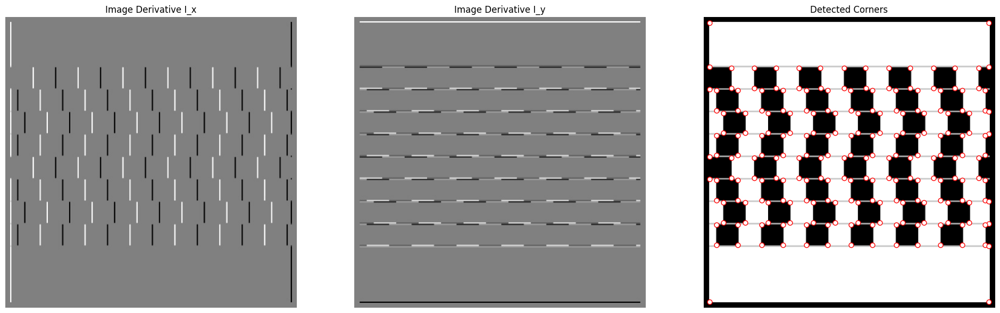

Detected corners with sigma = 1.5 and threshold = 0.025


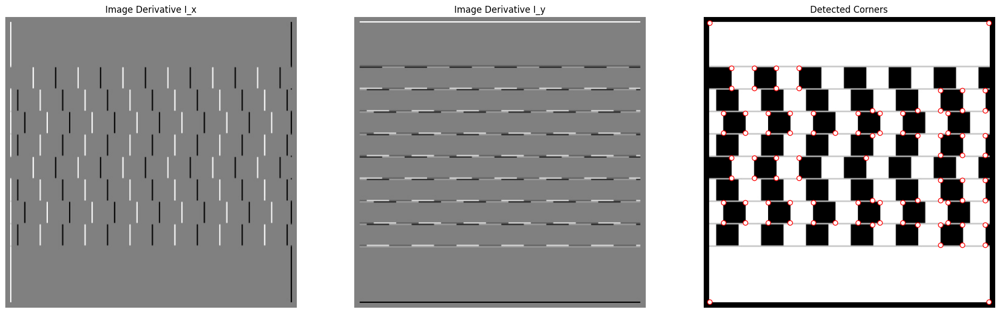

Detected corners with sigma = 1.0 and threshold = 0.03


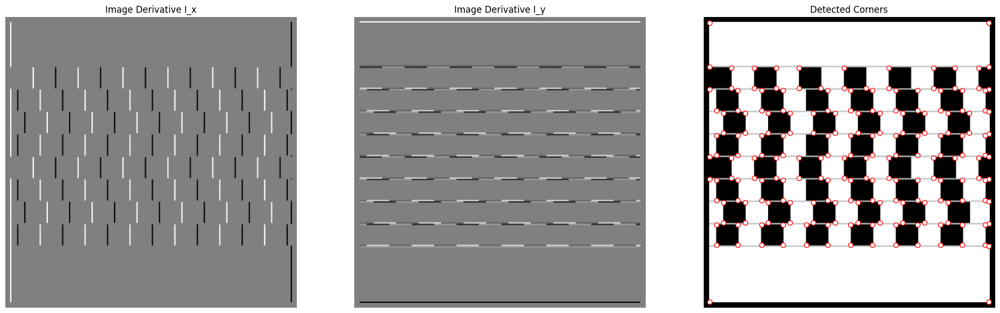

Detected corners with sigma = 1.0 and threshold = 0.035


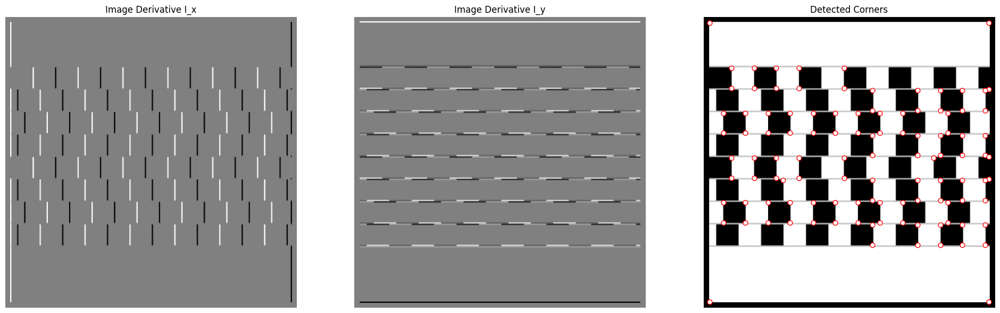

In [10]:
image_path = './images/checkerboard.jpg'

grayscale_image = convert_image_to_grayscale(image_path)

print("Detected corners with sigma = 1.5 and threshold = 0.02")
harris_response, rows, columns = harris_corner_detector(grayscale_image, sigma=1.5, threshold=0.02)
plot_harris_corner_detection_results(grayscale_image, rows, columns)

print("Detected corners with sigma = 1.5 and threshold = 0.025")
harris_response, rows, columns = harris_corner_detector(grayscale_image, sigma=1.5, threshold=0.025)
plot_harris_corner_detection_results(grayscale_image, rows, columns)

print("Detected corners with sigma = 1.0 and threshold = 0.03")
harris_response, rows, columns = harris_corner_detector(grayscale_image, sigma=1.0, threshold=0.03)
plot_harris_corner_detection_results(grayscale_image, rows, columns)

print("Detected corners with sigma = 1.0 and threshold = 0.035")
harris_response, rows, columns = harris_corner_detector(grayscale_image, sigma=1.0, threshold=0.035)
plot_harris_corner_detection_results(grayscale_image, rows, columns)




<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Write a script that loads an image, converts it to grayscale, detects corners using the Harris Corner Detection algorithm, and then plots the results using the `plot_harris_corner_detection_results` function.

Use the image **images/house.jpg** and experiment with the parameters. Make sure to adjust the parameters to effectively highlight the detected corners.

Detected corners with sigma = 10.0 and threshold = 0.000001


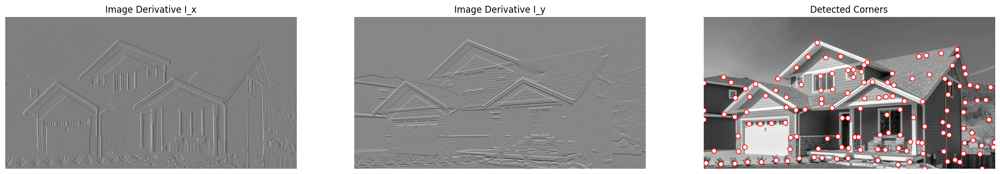

Detected corners with sigma = 5.0 and threshold = 0.000001


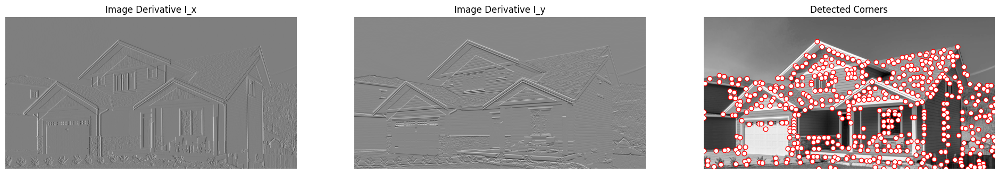

Detected corners with sigma = 10.0 and threshold = 0.0001


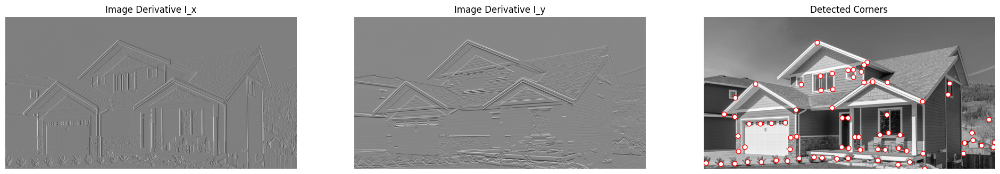

In [11]:
image_path = './images/house.jpg'

grayscale_image = convert_image_to_grayscale(image_path)

print("Detected corners with sigma = 10.0 and threshold = 0.000001")
harris_response, rows, columns = harris_corner_detector(grayscale_image, sigma=10.0, threshold=0.0000001)
plot_harris_corner_detection_results(grayscale_image, rows, columns)

print("Detected corners with sigma = 5.0 and threshold = 0.000001") #same threshold as before but lower sigma (more corners expected)
harris_response, rows, columns = harris_corner_detector(grayscale_image, sigma=5.0, threshold=0.000001)
plot_harris_corner_detection_results(grayscale_image, rows, columns)

print("Detected corners with sigma = 10.0 and threshold = 0.0001") #higher threshold (less corners expected)
harris_response, rows, columns = harris_corner_detector(grayscale_image, sigma=10.0, threshold=0.0001)
plot_harris_corner_detection_results(grayscale_image, rows, columns)


<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (5 points)</font>

Is the Harris Corner Detector algorithm rotation-invariant? How about your implementation? Rotate the **images/house.jpg** and **images/checkerboard.jpg** images by 45 and 90 degrees, and run the Harris Corner Detection algorithm on the rotated images.

Explain your answer and support it with your observations from both images.

##### <font color='yellow'>Answer:</font>

The Harris Corner Detector is in principle invariant to in-plane rotations, since the corner response is computed with eigenvalues, which are invariant to rotation. Nevertheless, using approximations for the derivatives affects the overall performance, and its effective precision is higher at 0°, 90° and 180°, where the gradient approximation is more accurate. In addition, rotating within a fixed image frame may modify the effective scale of the image structures, influencing the result of the corner response. Lastly, rotation requires resampling to the new grid, so a source pixel can land between grid points (at cell intersections) and its value is distributed (“splatting”) to neighboring pixels, slightly blurring/attenuating the corner response.

Our implementation of the algorithm shows exactly what stated above: 
* Some detected corners in the original images are missing in the 45°-rotated samples (e.g. top-right of the house's roof)
* The side effects of rotating the image (effective scale, splatting of pixels) can change the overall output of the corner response (e.g. checkerboard 45°-rotated sample displays more detected corners than the 90°-rotated one)

Note: We intentionally used unstable sigma/threshold values to highlight differences; with more stable settings, the Harris results are effectively rotation‑invariant across 0°, 45°, and 90°.

Overall, the results show that our implementation is sufficiently efficient despite these approximations, detecting nearly the same set of corners for the 0°, 45° and 90°-rotated samples.

**Source**: _"An Analysis and Implementation of the Harris Corner Detector", J. Sánchez, N. Monzón, A. Salgado, October 2018_

Detected corners with sigma = 10.0 and threshold = 0.000001


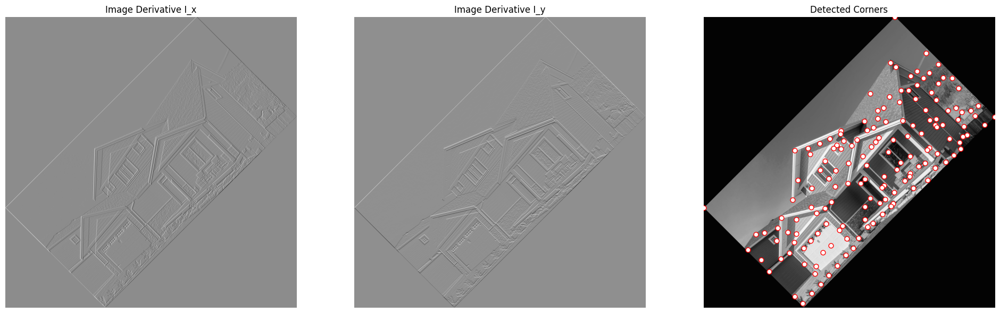

Detected corners with sigma = 10.0 and threshold = 0.000001


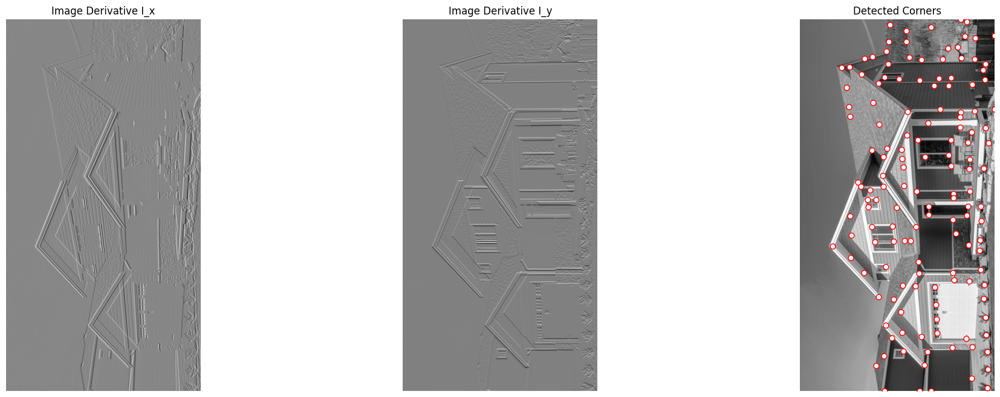

Detected corners with sigma = 1.5 and threshold = 0.025


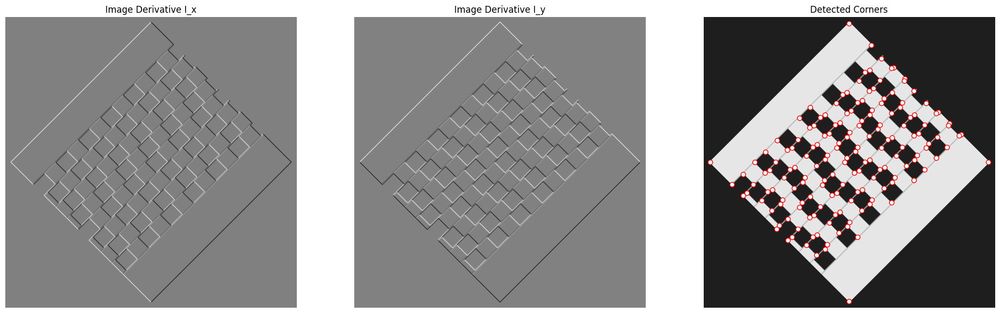

Detected corners with sigma = 1.5 and threshold = 0.025


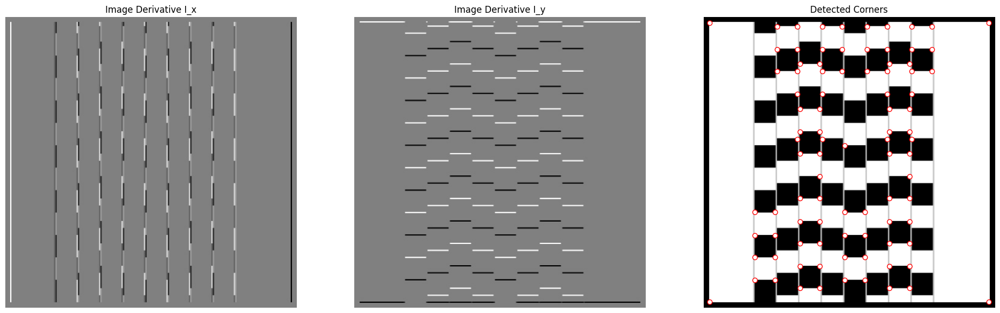

In [12]:
house_path = './images/house.jpg'
checkerboard_path = './images/checkerboard.jpg'

grayscale_house = convert_image_to_grayscale(house_path)
grayscale_checkerboard = convert_image_to_grayscale(checkerboard_path)

house45 = scipy.ndimage.rotate(grayscale_house, 45)
checkerboard45 = scipy.ndimage.rotate(grayscale_checkerboard, 45)

house90 = scipy.ndimage.rotate(grayscale_house, 90)
checkerboard90 = scipy.ndimage.rotate(grayscale_checkerboard, 90)


print("Detected corners with sigma = 10.0 and threshold = 0.000001")
harris_response, rows, columns = harris_corner_detector(house45, sigma=10.0, threshold=0.0000001) #chose the optimal threshold and sigma from previous tests
plot_harris_corner_detection_results(house45, rows, columns)

print("Detected corners with sigma = 10.0 and threshold = 0.000001")
harris_response, rows, columns = harris_corner_detector(house90, sigma=10.0, threshold=0.0000001)
plot_harris_corner_detection_results(house90, rows, columns)

print("Detected corners with sigma = 1.5 and threshold = 0.025")
harris_response, rows, columns = harris_corner_detector(checkerboard45, sigma=1.5, threshold=0.025) #chose a higher threshold than the optimal to show differences
plot_harris_corner_detection_results(checkerboard45, rows, columns)

print("Detected corners with sigma = 1.5 and threshold = 0.025")
harris_response, rows, columns = harris_corner_detector(checkerboard90, sigma=1.5, threshold=0.025)
plot_harris_corner_detection_results(checkerboard90, rows, columns)




<a id="section-2"></a>
### **Section 2: Good Features to Track (Shi & Tomasi)**

In this section, you will explore another definition of cornerness, introduced by *[Shi and Tomasi](https://ieeexplore.ieee.org/document/323794)*, which builds upon the original Harris definition discussed in Equation (12). Their algorithm presents an alternative approach to detecting good features for tracking. The upcoming questions will guide you through understanding and comparing their method to the Harris corner detection algorithm.

<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (3 points)</font>

How do Shi and Tomasi define cornerness? Write down their definition using the notations from **Equation (12)**.

##### <font color='yellow'>Answer:</font>

Shi and Tomasi define a corner as $H(x, y) = \min(\lambda_1, \lambda_2) > \lambda_t$ where $\lambda_1$ and $\lambda_2$ are the eigenvalues of $Q(x, y)$. To actually be a corner and not a different type of feature they both need to be large, while the minimum of the two has to be greater than the threshold $\lambda_t$ for the pixel to be selected.

**Source**: _"Good Features to Track", J. Shi, C. Tomasi, June 1994_

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (4 points)</font>

Does the Shi-Tomasi Corner Detector satisfy the properties of translation invariance, rotation invariance, and scale invariance? For each of these properties, explain whether the algorithm meets it and provide clear reasoning to support your answer.

##### <font color='yellow'>Answer:</font>

- Translation invariance:
    - The eigenvalues are **invariant** under translation. Let the image be shifted by a constant vector $t$; the gradients just shift spatially, so $Q$ simply appears at a new location $Q^′(x,y)=Q(x−t_x,y−t_y)$ and its numeric entries are identical. To add on, since the numeric entries are identical, so are the eigenvalues: $\lambda_1^′=\lambda_1, \lambda_2^′=\lambda_2$, hence $H^′=min⁡(\lambda_1^′,\lambda_2^′)=H$.
    Therefore it **is translation-invariant**.

- Rotation invariance:
    - As shown in the answer to question 8, eigenvalues are rotation invariant, so the Shi-Tomasi Corner detector **is rotation invariant**. \
      In discrete images it is only approximate due to derivative filters and resampling, but the principle holds.

- Scale invariance:
    - The eigenvalues of a matrix are not invariant to scaling. Because the Shi–Tomasi score is $H=min⁡(\lambda1,\lambda2)$, scaling an image by any factor that rescales $Q$ changes $H$ to $sH$. Thus the eigenvalues and therefore H are **not invariant to scaling**. 
    <br>
    <br>
    Here is a brief mathematical proof of the non-invariance of eigenvalues to scaling:
    <br>
    <br>
    Given $Q' = sQ = s\begin{bmatrix} a & b \\ b & d \end{bmatrix}$, its eigen-values $\lambda_1^{'}, \lambda_2^{'}$ satisfy the characteristic equation
    <br>
    \begin{equation}
        Det⁡(Q' − \lambda I)=\lambda^2 - (s(a+c))\lambda + (s^2(ac-b^2)) = 0
    \end{equation}
    <br>
    substituting $\lambda = s\lambda_s$  we obtain:
    <br>
    \begin{equation}
        s^2\lambda_s^2 - s^2\lambda_s(a+c) + s^2(ac-b^2) = 0
    \end{equation}
    <br>
    dividing by s^2
    <br>
    \begin{equation}
        \lambda_s^2 - \lambda_s(a+c) + (ac-b^2) = 0
    \end{equation}
    <br>
    and we find as roots $\lambda_{s1} = s\lambda_1$ and $\lambda_{s2} = s\lambda_2$, proving that the detector is not invariant to scaling.






<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (3 points)</font>

In the following scenarios, what could be the relative cornerness values assigned by Shi and Tomasi? Explain your reasoning.

1. Both eigenvalues are near 0.  
2. One eigenvalue is large, and the other is near zero.  
3. Both eigenvalues are large.

##### <font color='yellow'>Answer:</font>

Denoting that the cornerness value assigned by Shi and Tomasi is computed as : $H=min⁡(\lambda_1,\lambda_2)$:

1. If both eigenvalues are near 0, then $H \approx 0$. This represents a flat, texture-less region.

2. If one eigenvalue is large and the other is $\approx 0$, then $H=min⁡(large,0) \approx 0$. This means that there is a strong change of intensity in only one direction, which represents an edge.

3. If both eigenvalues are large, H equals the smaller between the two. This means that we will have intensity that varies significantly in two orthogonal directions, representing a corner.

**Source**: _"Good Features to Track", J. Shi, C. Tomasi, June 1994_

<a id="section-3"></a>
### **Section 3: Optical Flow and Lucas-Kanade Method**

In this section, a derivation of the *Optical Flow* algorithm and its implementation using the *[Lucas-Kanade method](https://www.ri.cmu.edu/pub_files/pub3/lucas_bruce_d_1981_2/lucas_bruce_d_1981_2.pdf)* for Optical Flow estimation is presented.

Optical flow refers to the apparent motion of image pixels or regions from one frame to the next, caused by moving objects in the scene or camera motion. A key assumption in optical flow is the *brightness constancy* assumption, which states that image values (such as brightness or color) remain constant over time, even if their 2D position changes in the image.

Algorithms for estimating optical flow use this assumption to compute a velocity field that describes the horizontal and vertical motion of each pixel in the image. For a 2D+t dimensional case, a voxel at location $(x, y, t)$ with intensity $I(x, y, t)$ will have moved by $\delta_x$, $\delta_y$, and $\delta_t$ between two image frames. This results in the following image constraint equation:

\begin{equation}
I(x, y, t) = I(x + \delta_x, y + \delta_y, t + \delta_t). \tag{15}
\end{equation}

Assuming the movement is small, the image constraint at $I(x, y, t)$ can be approximated using the first-order Taylor expansion:

\begin{equation}
I(x + \delta_x, y + \delta_y, t + \delta_t) \approx I(x, y, t) + \frac{\partial I}{\partial x} \delta_x + \frac{\partial I}{\partial y} \delta_y + \frac{\partial I}{\partial t} \delta_t \tag{16}
\end{equation}

Since changes in the image are assumed to be purely due to movement, we get:

\begin{equation}
\frac{\partial I}{\partial x} \frac{\delta_x}{\delta_t} + \frac{\partial I}{\partial y} \frac{\delta_y}{\delta_t} + \frac{\partial I}{\partial t} \frac{\delta_t}{\delta_t} = 0 \tag{17}
\end{equation}

or more concisely:

\begin{equation}
I_x V_x + I_y V_y = -I_t, \tag{18}
\end{equation}

where $V_x$ and $V_y$ are the $x$ and $y$ components of the velocity (or optical flow) of $I(x, y, t)$. Here, $I_x$, $I_y$, and $I_t$ are the partial derivatives of the image at $(x, y, t)$ with respect to $x$, $y$, and $t$, respectively. This is the main equation for optical flow.

Optical flow is challenging to compute for two main reasons:

1. **Ambiguity in homogeneous regions**: In image regions with uniform brightness, the optical flow is ambiguous because the brightness constancy assumption can be satisfied by multiple different motions.

2. **Violation of the brightness constancy assumption**: In real-world scenes, the brightness constancy assumption can be violated at motion boundaries or due to factors such as changing lighting, non-rigid motions, shadows, transparency, reflections, etc.

To resolve the ambiguity in homogeneous regions, optical flow methods often make additional assumptions about the spatial variation of the flow field. These assumptions are approximate and may introduce errors in the estimated flow. The second problem can be addressed by using robust statistical methods or more complex models that can handle violations of the brightness constancy assumption.

The *Lucas-Kanade method* assumes that the optical flow remains constant within a local neighborhood of the pixel being considered. Therefore, the main equation of optical flow holds for all pixels in a small window centered at the pixel in question. Let's consider a pixel $p$. For all pixels around $p$, the local image flow vector $(V_x, V_y)$ must satisfy the following system of equations:

\begin{equation}
I_x(q_1)V_x + I_y(q_1)V_y = - I_t(q_1) \tag{19}
\end{equation}

\begin{equation}
I_x(q_2)V_x + I_y(q_2)V_y = - I_t(q_2) \tag{19}
\end{equation}

$$ \vdots $$

\begin{equation}
I_x(q_n)V_x + I_y(q_n)V_y = - I_t(q_n) \tag{19}
\end{equation}

where $q_1$, $q_2$, ... $q_n$ are the pixels inside the window around $p$, and $I_x(q_i)$, $I_y(q_i)$, and $I_t(q_i)$ are the partial derivatives of the image $I$ with respect to $x$, $y$, and $t$, evaluated at each point $q_i$.

This system can be rewritten in matrix form as $Av = b$, where:

\begin{equation}
A = \begin{bmatrix}
I_x(q_1) & I_y(q_1) \\
I_x(q_2) & I_y(q_2) \\
\vdots   & \vdots   \\
I_x(q_n) & I_y(q_n)
\end{bmatrix}, 
v = \begin{bmatrix}
V_x \\
V_y
\end{bmatrix}, 
b = \begin{bmatrix}
-I_t(q_1) \\
-I_t(q_2) \\
\vdots   \\
-I_t(q_n)
\end{bmatrix} \tag{20}
\end{equation}

Since this system has more equations than unknowns, it is typically over-determined. The Lucas-Kanade method solves this using the weighted least-squares principle, obtaining an approximate solution by minimizing the squared error. This results in solving the following $2 \times 2$ system:

\begin{equation}
A^T A v = A^T b \tag{21}
\end{equation}

or equivalently:

\begin{equation}
v = (A^T A)^{-1} A^T b \tag{22}
\end{equation}

In this solution, $A^T A$ is a $2 \times 2$ matrix, and $(A^T A)^{-1}$ is its inverse. This allows us to compute the local velocity components $V_x$ and $V_y$ for the pixel $p$.

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (20 points)</font>

For this question, you will be given four pairs of images: **sphere1.jpg**, **sphere2.jpg**; **plant1.jpg**, **plant2.jpg**; **car1.jpg**, **car2.jpg**;  and **table1.jpg**, **table2.jpg**. You are required to estimate the optical flow between each pair of images using the Lucas-Kanade algorithm.

First, divide the input images into non-overlapping regions, each of size $20 \times 20$ pixels. For each region, compute the matrix $A$, its transpose $A^T$, and the vector $b$. Then, estimate the optical flow for that region using the equation:

$$ v = (A^T A)^{-1} A^T b $$

You will implement the function `compute_image_derivatives` to calculate the x, y, and time derivatives of the images. Next, use the function `calculate_image_subregions` to divide the image derivatives into non-overlapping subregions. Afterward, estimate the optical flow for each subregion using the function `calculate_optical_flow_for_subregions`, which solves the linear system for each subregion.

Once you have the optical flow estimates $(V_x, V_y)$ for each region, visualize the results. For this, use the function `plot_optical_flow_with_images` to display frame 1, frame 2, and the optical flow vectors. The **matplotlib** function `quiver` will help you plot the optical flow vectors as arrows on the image. Additionally, you will implement the function `calculate_optical_flow_lucas_kanade` to handle the complete process of optical flow estimation and subregion management.

Finally, include a demo function to load the images and call the necessary functions to compute and plot the optical flow.

**Note**: You can use non-overlapping regions of size $20 \times 20$ pixels. For example, if the input images are $256 \times 256$, you should obtain a $12 \times 12$ grid of optical flow vectors. For each region, the matrix $\textbf{A}$ will have dimensions $400 \times 2$, and the vector $\mathbf{b}$ will have dimensions $400 \times 1$. When performing convolutions, you can use `scipy.signal.convolve2d`. While using the **matplotlib** `quiver` function, be mindful that by default, the angles of the arrows are 45 degrees counterclockwise from the horizontal axis, which may cause them to point in the wrong direction. Ensure to adjust for this and experiment with scaling to properly visualize the optical flow vectors.

In [13]:
def compute_image_derivatives(image_time_0, image_time_1):
    """
    Computes the x, y, and time derivatives of an image.
    
    Args:
        image_time_0: Grayscale image at time t0 as a numpy array.
        image_time_1: Grayscale image at time t1 as a numpy array.
    
    Returns:
        image_derivative_x: Derivative of the image in the x direction using the [1, 0, -1] filter.
        image_derivative_y: Derivative of the image in the y direction using the [[1], [0], [-1]] filter.
        image_derivative_time: Derivative of the image in time (t1 - t0).
    """
    
    # Compute spatial derivatives
    image_derivative_x = compute_gradient_x(image_time_0)
    image_derivative_y = compute_gradient_y(image_time_0)

    image_derivative_time = image_time_1 - image_time_0

    return image_derivative_x, image_derivative_y, image_derivative_time

In [14]:
def calculate_image_subregions(image_time_0, image_derivative_x, image_derivative_y, image_derivative_time, region_size):
    """
    Divides the image derivatives into subregions of the given size.
    
    Args:
        image_time_0: Grayscale image at time t0.
        image_derivative_x: Derivative of the image in the x direction.
        image_derivative_y: Derivative of the image in the y direction.
        image_derivative_time: Time derivative of the image.
        region_size: The size of each subregion.
    
    Returns:
        subregions_derivative_x: List of subregions of the image x-derivative.
        subregions_derivative_y: List of subregions of the image y-derivative.
        subregions_derivative_time: List of subregions of the image time-derivative.
    """
    
    # Ensure the image dimensions are multiples of region_size
    h, w = image_time_0.shape
    h_fitted = (h // region_size) * region_size
    w_fitted = (w // region_size) * region_size

    # Determine the subregions
    subregions_derivative_x = []
    subregions_derivative_y = []
    subregions_derivative_time = []
    
    # Loop over the image in steps of region_size to extract subregions
    for row in range(0, h_fitted, region_size):
        for col in range(0, w_fitted, region_size):
            subregions_derivative_x.append(image_derivative_x[row:row+region_size, col:col+region_size])
            subregions_derivative_y.append(image_derivative_y[row:row+region_size, col:col+region_size])
            subregions_derivative_time.append(image_derivative_time[row:row+region_size, col:col+region_size])

    return subregions_derivative_x, subregions_derivative_y, subregions_derivative_time

In [15]:
def calculate_optical_flow_for_subregions(subregion_derivatives_x, subregion_derivatives_y, subregion_derivatives_time):
    """
    Estimates the optical flow for each subregion by solving the linear system.
    
    Args:
        subregion_derivatives_x: List of x-derivative subregions.
        subregion_derivatives_y: List of y-derivative subregions.
        subregion_derivatives_time: List of time-derivative subregions.
    
    Returns:
        flow_vectors_x: List of optical flow estimates in the x direction for each subregion.
        flow_vectors_y: List of optical flow estimates in the y direction for each subregion.
    """
    
    flow_vectors_x = []
    flow_vectors_y = []

    for subregion_dx,subregion_dy,subregion_dt in zip(subregion_derivatives_x, subregion_derivatives_y, subregion_derivatives_time):
        # Formulate and solve the linear equation for the optical flow
        A = np.array([np.ndarray.flatten(subregion_dx), np.ndarray.flatten(subregion_dy)]).transpose()
        b = -np.array(np.ndarray.flatten(subregion_dt))
        b = b[:, np.newaxis]
        v = np.linalg.inv(A.T @ A) @ A.T @ b
        
        flow_vectors_x.append(v[0])
        flow_vectors_y.append(v[1])
    
    return flow_vectors_x, flow_vectors_y

In [16]:
def calculate_optical_flow_lucas_kanade(image_time_0, image_time_1, region_size=20):
    """
    Estimates optical flow between two images using the Lucas-Kanade method.
    
    Args:
        image_time_0: Grayscale image at time t0.
        image_time_1: Grayscale image at time t1.
        region_size: The size of each subregion for optical flow estimation.
    
    Returns:
        subregion_centers: The center coordinates of each subregion.
        flow_vectors_x: Optical flow vectors in the x direction.
        flow_vectors_y: Optical flow vectors in the y direction.
    """

    # Compute image derivatives
    image_dx, image_dy, image_dt = compute_image_derivatives(image_time_0, image_time_1)

    # Divide the image derivatives into subregions
    subregions_dx, subregions_dy, subregions_dt = calculate_image_subregions(image_time_0, image_dx, image_dy, image_dt, region_size)
    
    # Calculate optical flow for each subregion
    flow_vectors_x, flow_vectors_y = calculate_optical_flow_for_subregions(subregions_dx, subregions_dy, subregions_dt)
    
    half_region_size = region_size // 2
    height, width = image_time_0.shape
    subregion_centers = []

    # Calculate the center coordinates of each subregion
    for r in range(0, height - region_size + 1, region_size):
        for c in range(0, width - region_size + 1, region_size):
            center_x = c + half_region_size
            center_y = r + half_region_size
            subregion_centers.append((center_x, center_y))
    
    return subregion_centers, flow_vectors_x, flow_vectors_y

In [26]:
def plot_optical_flow_with_images(image_time_0, image_time_1, subregion_centers, flow_vectors_x, flow_vectors_y):
    """
    Plots frame 1, frame 2, and the optical flow vectors in a 3-column subplot.
    
    Args:
        image_time_0: Grayscale image at time t0.
        image_time_1: Grayscale image at time t1.
        subregion_centers: The center coordinates of each subregion.
        flow_vectors_x: Optical flow vectors in the x direction.
        flow_vectors_y: Optical flow vectors in the y direction.
    
    Returns:
        None. Displays the subplot with optical flow and images.
    """
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(image_time_0, cmap='gray')
    axes[0].set_title('Image at frame 1')
    axes[0].axis('off')

    axes[1].imshow(image_time_1, cmap='gray')
    axes[1].set_title('Image at frame 2')
    axes[1].axis('off')

    # Extract x and y coordinates of subregion centers
    subregion_centers_x = [center[0] for center in subregion_centers]
    subregion_centers_y = [center[1] for center in subregion_centers]

    axes[2].imshow(image_time_0, cmap='gray')
    axes[2].quiver(subregion_centers_x, subregion_centers_y, flow_vectors_x, flow_vectors_y, color='yellow', angles='xy')
    axes[2].set_title('Optical Flow')
    axes[2].axis('off') 

    plt.suptitle('Lukas-Kanade Optical Flow')
    plt.tight_layout()
    plt.show()

    return

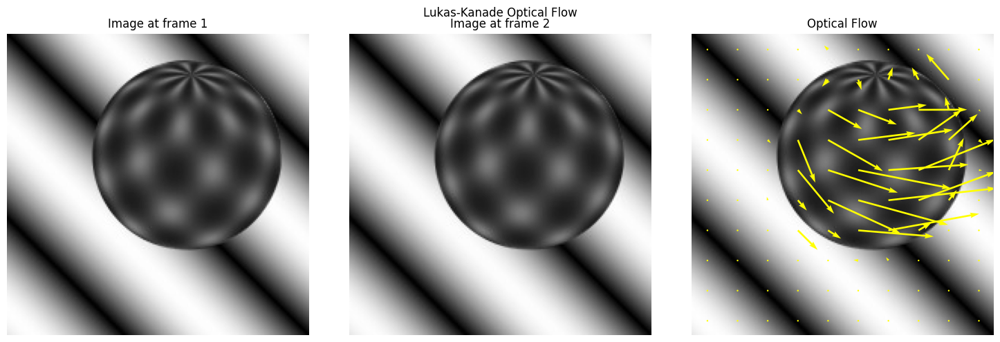

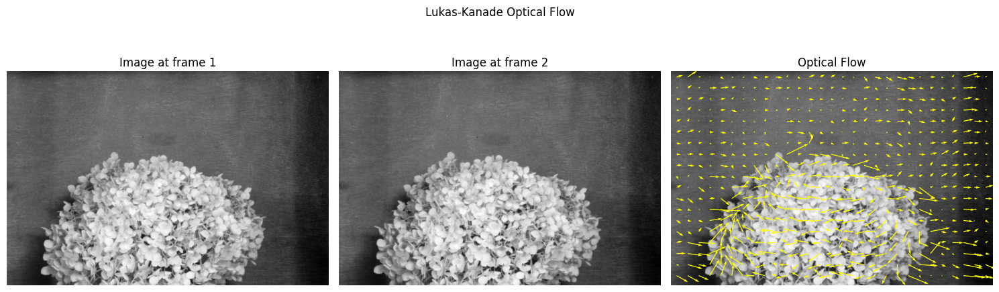

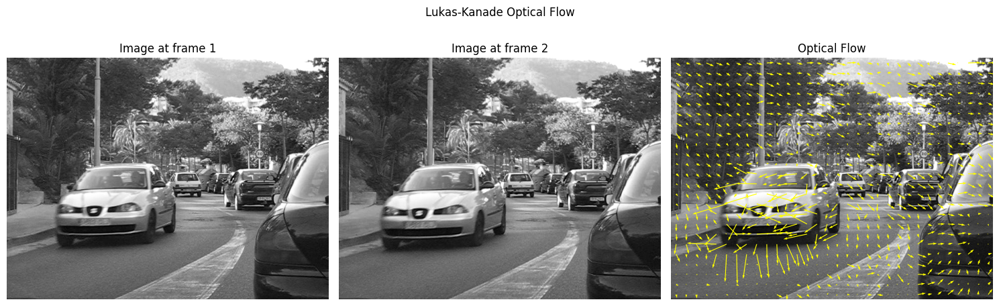

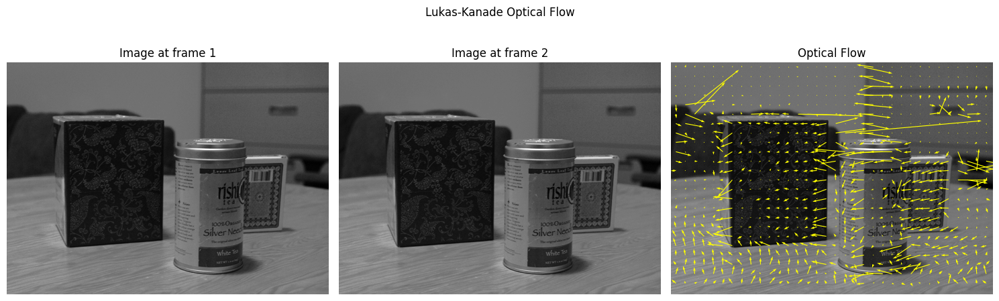

In [27]:
sphere1, sphere2 = cv2.imread('images/sphere1.jpg'), cv2.imread('images/sphere2.jpg')
plant1, plant2 = cv2.imread('images/plant1.jpg'), cv2.imread('images/plant2.jpg')
car1, car2 = cv2.imread('images/car1.jpg'), cv2.imread('images/car2.jpg')
table1, table2 = cv2.imread('images/table1.jpg'), cv2.imread('images/table2.jpg')

image_sets = [[sphere1, sphere2], [plant1, plant2], [car1, car2], [table1, table2]]

for image_set in image_sets:
    # Make the images grayscale
    if np.ndim(image_set[0]) == 3:
        image1, image2 = cv2.cvtColor(image_set[0], cv2.COLOR_BGR2GRAY) / 256, cv2.cvtColor(image_set[1], cv2.COLOR_BGR2GRAY) / 256
    

    subregion_centers, flow_vectors_x, flow_vectors_y = calculate_optical_flow_lucas_kanade(image1, 
                                                                                            image2, 
                                                                                            region_size=20)
    
    
    plot_optical_flow_with_images(image1, image2, subregion_centers, flow_vectors_x, flow_vectors_y)
    

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (4 points)</font>

Compare the Lucas-Kanade method and the *[Horn-Schunck method](https://www.sciencedirect.com/science/article/abs/pii/0004370281900242)* in terms of the scale at which they operate (local or global), and explain your answer.

##### <font color='yellow'>Answer:</font>

The Lucas-Kanade method calculates the flow-vector locally. This is directly seen from the fact that the flow vector $v$ is calculated over a small window: $v=(A^TA)A^T b$, where $A$ and $b$ are determined in a local environment. Each window is treated independently.

The Horn-Schunck method is a global method. Horn-Schunck minimizes the total error of the flow vectors over the entire image $\mathscr{C}^2 = \int\int(\mathscr{C}_c^2 + \mathscr{C}_b^2)\,dx\,dy$. Because of this, the resulting flow-vectors will give a smoother result, which is also one of the assumptions that Horn and Schunk made.

**Source**: _"Determining Optical Flow", B.K.P. Horn, B.G. Schunck, March 1980_

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (4 points)</font>

Compare the behavior of the Lucas-Kanade method and the *[Horn-Schunck method](https://www.sciencedirect.com/science/article/abs/pii/0004370281900242)* in flat regions of the image. Explain the differences or similarities between the two algorithms.

##### <font color='yellow'>Answer:</font>

The Lucas-Kanade method only assumes that the flow is constant in a neighborhood around a point. This means that if the region is flat (low-texture), this does not provide much information to the Lucas-Kanade method.; with $I_x \approx I_y \approx 0$ the normal equations become ill‑conditioned (aperture problem). \
On a flat surface, it is usually the case that movement is constant across the entire surface, but that isn't always the case.

The Horn-Schunck method works especially well on flat regions of the image. This is because one of the assumptions that Horn and Schunck make is that the optical flow field is globally smooth. This assumption holds when the image is actually flat, so this is why the Horn-Schunck method works well in these cases. This assumption allows the algorithm to enforce a globally smooth flow, which works well in flat regions but may oversmooth across motion boundaries.

**Sources**: 
- _"Determining Optical Flow", B.K.P. Horn, B.G. Schunck, March 1980_ 
- _"An iterative Image Registration Technique with an Application to Stereo Vision", B.D. Lucas, T. Kanade, August 1981_

<a id="section-4"></a>
### **Section 4: Feature Tracking**

In this section of the assignment, you will develop a basic feature-tracking algorithm, a fundamental tool in computer vision. The goal is to detect visual features, such as corners or other distinct points of interest, and track their movement across multiple frames in a video or image sequence. 

Feature tracking is a crucial step in many applications, including motion detection, object recognition, and 3D reconstruction. By accurately identifying and following key features, you can gain insight into how objects move and interact over time. 

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (17 points)</font>

In this question, you will implement a basic feature-tracking algorithm. First, detect feature points on the first frame of each image sequence using the **Harris Corner Detector** from **Section 1**. Then, track these points across subsequent frames using the **Lucas-Kanade algorithm** for optical flow estimation, which you implemented in **Section 2**.

Your task is to complete the function `calculate_optical_flow_at_corners`, which should track the corners from the first frame and compare them to the corners in the current frame. You can take inspiration from your `calculate_optical_flow_for_subregions` function, adapting it to process individual corners rather than subregions.

After completing this, you also need to finish the `process_sequence` function, which computes and visualizes the optical flow over an entire image sequence and saves the results as a video. The steps involve loading consecutive frames from the image sequence, converting them to grayscale, detecting corners in the first frame, computing the image gradients between frames, and calculating optical flow at the detected corners. Finally, the results will be visualized using flow vectors and saved as a video.

In [19]:
def calculate_optical_flow_at_corners(image_gradient_x, image_gradient_y, image_gradient_t, corners, window_size):
    """
    Calculates optical flow vectors at the provided corners using the Lucas-Kanade method.

    Args:
        image_gradient_x: Gradient of the image along the x-axis.
        image_gradient_y: Gradient of the image along the y-axis.
        image_gradient_t: Temporal gradient between two consecutive frames.
        corners: Tuple of (row, column) indices where corners are detected.
        window_size: Size of the window used for computing flow.

    Returns:
        valid_corners: List of valid corners (row, column) where the flow was successfully computed.
                       Corners that do not have enough valid pixels in the surrounding window to compute flow should be excluded.
        flow_vectors: List of optical flow vectors (u, v) for each valid corner.
    """

    half_window_size = window_size // 2
    valid_corners = []
    flow_vectors = []

    # Extract subregions around each corner
    subregions_x, subregions_y, subregions_t = [], [], []
    for r, c in corners:
        x_in_bounds = r - half_window_size >= 0 and r + half_window_size < image_gradient_x.shape[0]
        y_in_bounds = c - half_window_size >= 0 and c + half_window_size < image_gradient_x.shape[1]
        
        # Only consider corners where the full window fits within the image boundaries
        if x_in_bounds and y_in_bounds:
            valid_corners.append([r, c])
            subregions_x.append(image_gradient_x[r - half_window_size:r + half_window_size, c - half_window_size:c + half_window_size])
            subregions_y.append(image_gradient_y[r - half_window_size:r + half_window_size, c - half_window_size:c + half_window_size])
            subregions_t.append(image_gradient_t[r - half_window_size:r + half_window_size, c - half_window_size:c + half_window_size])
    
    # Calculate optical flow for each valid corner's subregion
    flow_vectors_x, flow_vectors_y = calculate_optical_flow_for_subregions(subregions_x, subregions_y, subregions_t)
    flow_vectors = np.hstack((np.array(flow_vectors_x), np.array(flow_vectors_y)))
    
    return np.array(valid_corners), flow_vectors

In [30]:
def process_sequence(sequence_name,
                     sigma=1.5,
                     corner_threshold=0.001,
                     window_size=20,
                     scaling_factor=1):
    """
    Processes an image sequence to compute and visualize optical flow,
    saving the result as a video using OpenCV.

    Args:
        sequence_name: Name of the image sequence ('basketball' or 'toy').
        sigma: Standard deviation for Gaussian filtering in Harris corner detection.
        corner_threshold: Threshold for detecting strong corners.
        window_size: Size of the window used for optical flow calculations.
        scaling_factor: Scaling factor for the flow vectors in the visualization.

    Returns:
        None. Saves the visualization video in the current directory.
    """

    imagePath = f"frames/{sequence_name}/"
    frames = os.listdir(imagePath)
    frames.sort()
    frame_0 = cv2.imread(os.path.join(imagePath, frames[0]), cv2.IMREAD_GRAYSCALE)
    
    fig, ax = plt.subplots()
    ax.imshow(frame_0, cmap='gray')
    ax.axis("off")
        
    fig.canvas.draw()
    frame_0 = np.array(fig.canvas.renderer.buffer_rgba())
    frame_0 = cv2.cvtColor(frame_0, cv2.COLOR_RGB2GRAY)
    
    fourcc = cv2.VideoWriter.fourcc(*'avc1')
    video = cv2.VideoWriter(f"{sequence_name}_flow.mp4", fourcc, 18, frame_0.T.shape, isColor=True)

    plt.close()
    
    theta = np.pi/2
    R = np.array([[np.cos(theta), -np.sin(theta)],
                  [np.sin(theta), np.cos(theta)]])
    
    len_frames = len(frames)
    for i in range(1, len_frames):
        curr_frame_1 = convert_image_to_grayscale(os.path.join(imagePath, frames[i-1]))
        curr_frame_2 = convert_image_to_grayscale(os.path.join(imagePath, frames[i]))
        
        # Detect corners in the first frame
        _, rows, columns = harris_corner_detector(curr_frame_1, sigma, corner_threshold)
        corners = np.vstack((np.array(rows), np.array(columns))).T
        
        # Compute image gradients and flow at corners
        image_gradient_x, image_gradient_y, image_gradient_t = compute_image_derivatives(curr_frame_1, curr_frame_2)
        valid_corners, flow_vectors = calculate_optical_flow_at_corners(image_gradient_x,
                                                                        image_gradient_y,
                                                                        image_gradient_t,
                                                                        corners,
                                                                        window_size)
        
        flow_vectors = flow_vectors @ R.T
        
        fig, ax = plt.subplots()
        ax.imshow(curr_frame_1, cmap='gray')
        ax.scatter(valid_corners[:, 1], valid_corners[:, 0], s=2, c='yellow')
        ax.quiver(valid_corners[:, 1], valid_corners[:, 0], flow_vectors[:, 1], flow_vectors[:, 0], color='yellow', angles='uv')
        ax.axis("off")
        
        fig.canvas.draw()
        new_frame = np.array(fig.canvas.renderer.buffer_rgba())
        new_frame = cv2.cvtColor(new_frame, cv2.COLOR_RGB2BGR)
        
        video.write(new_frame)
        plt.close()
        
    video.release()
    return f"{sequence_name}_flow.mp4"

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (6 points)</font>  

For this part, you are required to prepare a video for each image sequence, showing both the initial feature points and their tracked optical flow over time. You should test your implementation and generate visualization videos for the **basketball** and **toy** sequences, ensuring the visualizations clearly display the feature points and the optical flow vectors. The frames for the **basketball** sequence can be found inside the `frames/basketball/` directory, and the frames for the **toy** sequence are located in `frames/toy/`.

**Note**: To visualize the videos directly inside the notebook, you should use the `Video` function from **IPython.display**. This will allow you to render the video output within the notebook, making it easier to review your results without needing an external video player. Make sure the path to the video file is correctly specified, and the video is in a supported format (e.g., `.mp4`). Ensure that the video format is **mp4** and encoded using `fourcc = cv2.VideoWriter_fourcc(*'avc1')` to guarantee compatibility with most players and browsers.

In [31]:
video_path = process_sequence("basketball")
Video(video_path, embed=True)

In [33]:
video_path = process_sequence("toy")
Video(video_path, embed=True)

<a id="section-5"></a>
### **Section 5: Optical Flow with RAFT Model**

In this section, you will work with code to run, test, and play with the RAFT optical flow model. RAFT (Recurrent All-Pairs Field Transforms) is a powerful deep learning model for predicting the motion of objects between consecutive video frames. The code provided will allow you to predict optical flow between selected frame pairs from a video.

The function `optical_flow_prediction` lets you choose between two different versions of the RAFT model: one with **small weights** and another with **large weights**. Depending on your machine's specs, you can switch between these two options by setting the `weight_type` parameter to either `'small'` or `'large'`. If you're using a lower-spec laptop or computer, the small weight model is recommended for faster performance, while the large weight model provides more accuracy but requires more computational power.

You will also need to install the `av` package, which is required to process video frames. You can install it using the following command: `pip install av`. **Make sure to restart the kernel after installing the package.**

RAFT is a state-of-the-art deep learning model for optical flow estimation, known for its high accuracy and efficiency. It works by comparing all pixel pairs between two consecutive frames and iteratively refining the flow predictions using a recurrent neural network. This method enables RAFT to capture detailed motion in complex scenes. For a deeper understanding of the architecture and techniques behind RAFT, which you can find in the paper: [RAFT: Recurrent All-Pairs Field Transforms for Optical Flow](https://arxiv.org/abs/2003.12039).

In [23]:
def plot_optical_flow(img1_batch, img2_batch, flow_imgs):
    """
    Plots the original frames and their corresponding optical flow side by side.

    Args:
        img1_batch: Batch of the first frames from each pair of consecutive frames.
        img2_batch: Batch of the second frames from each pair of consecutive frames.
        flow_imgs: Batch of predicted optical flow images corresponding to each frame pair.

    Returns:
        None. Displays the original frames and optical flow visualization in a grid format.
    """

    num_images = len(img1_batch)
    _, axs = plt.subplots(nrows=num_images, ncols=3, figsize=(12, 6), squeeze=False)

    for idx in range(num_images):
        img1 = F.to_pil_image(img1_batch[idx].to("cpu"))
        img2 = F.to_pil_image(img2_batch[idx].to("cpu"))
        flow_img = F.to_pil_image(flow_imgs[idx].to("cpu"))

        # Frame 1
        axs[idx, 0].imshow(np.asarray(img1))
        axs[idx, 0].set_title(f'Frame 1 - Pair {idx + 1}')
        axs[idx, 0].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

        # Frame 2
        axs[idx, 1].imshow(np.asarray(img2))
        axs[idx, 1].set_title(f'Frame 2 - Pair {idx + 1}')
        axs[idx, 1].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

        # Optical Flow
        axs[idx, 2].imshow(np.asarray(flow_img))
        axs[idx, 2].set_title(f'Optical Flow - Pair {idx + 1}')
        axs[idx, 2].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

    plt.tight_layout()
    plt.show()

In [24]:
def optical_flow_prediction(weight_type='small', frame_pairs=[(100, 101), (150, 151)]):
    """
    Predicts optical flow between pairs of consecutive frames from a video using the RAFT model.

    Args:
        weight_type: Specifies the RAFT model's weight type ('small' or 'large') for optical flow prediction.
        frame_pairs: List of tuples, where each tuple contains two frame indices representing consecutive frames
                     (default: [(100, 101), (150, 151)]).

    Returns:
        None. Visualizes the optical flow between the selected frames.
    """

    # Define the local video path
    video_path = Path("video/basketballer.mp4")

    # Read video frames using torchvision's `read_video` and use `pts_unit='sec'` to avoid warnings
    frames, _, _ = read_video(str(video_path), output_format="TCHW", pts_unit="sec")

    # Select the pairs of consecutive frames based on the provided frame_pairs argument
    img1_batch = torch.stack([frames[pair[0]] for pair in frame_pairs])
    img2_batch = torch.stack([frames[pair[1]] for pair in frame_pairs])

    # Prepare the images for input to the RAFT model
    if weight_type == 'small':
        weights = Raft_Small_Weights.DEFAULT
        model_fn = raft_small
    elif weight_type == 'large':
        weights = Raft_Large_Weights.DEFAULT
        model_fn = raft_large
    else:
        raise ValueError("weight_type must be either 'small' or 'large'")

    transforms = weights.transforms()
    img1_batch = F.resize(img1_batch, size=[520, 960], antialias=False)
    img2_batch = F.resize(img2_batch, size=[520, 960], antialias=False)
    img1_batch, img2_batch = transforms(img1_batch, img2_batch)

    # Define the device (GPU if available, otherwise CPU)
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # Load the RAFT model with pre-trained weights based on the chosen weight type
    model = model_fn(weights=weights, progress=True).to(device).eval()

    # Predict the optical flow between the pairs of images
    list_of_flows = model(img1_batch.to(device), img2_batch.to(device))

    # Select the final flow prediction (last iteration is the most accurate)
    predicted_flows = list_of_flows[-1]

    # Convert the flow tensor into an RGB image for visualization
    flow_imgs = flow_to_image(predicted_flows)

    # Adjust the original frames for plotting (convert from [-1, 1] to [0, 1])
    img1_batch = [(img1 + 1) / 2 for img1 in img1_batch]
    img2_batch = [(img2 + 1) / 2 for img2 in img2_batch]

    # Call the function to plot the frames and their corresponding optical flow
    plot_optical_flow(img1_batch, img2_batch, flow_imgs)

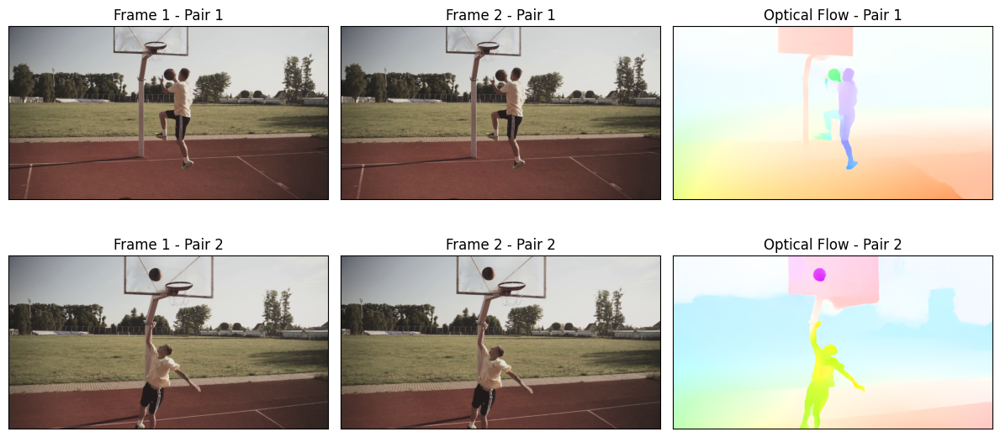

In [25]:
# Call the function to run the optical flow prediction and visualization
optical_flow_prediction(weight_type='large', frame_pairs=[(100, 101), (150, 151)])

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (3 points)</font>

After running the provided code, you see two different frame pairs and the optical flow predictions for each. In the flow visualization, objects like the ball are shown in different colors in the two frame pairs. Explain what the colors represent in the optical flow and why the ball appears in a different color in the two frame pairs.

##### <font color='yellow'>Answer:</font>

In Optical Flow different colors represent different aspects of motion between frames. The motion is represented using the HSV color space, where the hue represents the direction of movement, and the brightness indicates how fast the object is moving. In this case in the first couple of frames the ball has the same hue of the right leg as they both have a similar optical flow. In the second couple fo frames inestead they show different hues since the ball is going upwards while the body is not.

**Source**: _"Determining Optical Flow", B.K.P. Horn, B.G. Schunck, March 1980_

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (3 points)</font>

Both the Lucas-Kanade and the Horn-Schunk methods work with assumptions about the conditions of the images. Give one example for each of these methods in which they might have trouble, and explain whether RAFT suffers from the same problem and why this might be the case.

##### <font color='yellow'>Answer:</font>

The Lucas-Kanade method assumes that motion is small and that the flow is locally constant within a small window. Hence, it may fail when there are great differences between frames, such as when an object moves very quickly. In such cases, the method may fails to find correct correspondences because the true motion exceeds the window size. 

On the other hand, the Horn-Schunck method assumes that the optical flow field is globally smooth across the entire image. This can be problematic at motion boundaries, where neighboring pixels actually belong to different objects moving in different directions. For example, at the edge of a moving object against a static background, Horn-Schunck may incorrectly smooth the flow across the boundary, resulting in inaccurate motion estimates.

RAFT, as a deep learning-based model, does not rely on these assumptions. In fact, it learns to estimate optical flow from image datasets with differents motion patterns. As a result, RAFT is much less affected by the problems that challenge Lucas-Kanade and Horn-Schunck. It can handle large motions and preserve sharp boundaries between moving objects and backgrounds, because its architecture and training data allow it to model complex, non-smooth motion fields. However, RAFT may still face challenges in cases where the input images are very different from its training data but these issues are generally less severe than those faced by classical methods.

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (3 points)</font>

What are the three main components of the RAFT architecture? Briefly explain each component.

##### <font color='yellow'>Answer:</font>

The three main components of the RAFT architecture are: Feature encoder, Correlation layer and the Update operator.

- **The feature encoder** allows for the extraction of a feature vector for each pixel in both input images using a convolutional neural network. This step transforms the raw images $I_1$ and $I_2$ into a dense feature maps at a lower resolution. A learned representation that captures important visual information for matching pixels between frames.

- **The correlation layer** computex visual similarity by constructing a full 4D correlation volume between all pairs. The volume is constructed by computing the similarity (via dot product) between every pair of feature vectors from the two images. This volume encodes how well each pixel in the first image matches every pixel in the second image, providing a dense map of possible correspondences. The set of volumes gives information about both large and small displacements; however, by maintaining the first 2 dimensions (the I1 dimensions) they manage to maintain high resolution information, allowing the method to recover the motions of small fast-moving objects.

- The recurrent **update operator** iteratively updates the optical flow field. At each step, it takes flow, correlation, and a latent hidden state as input, and it outputs the updated hidden state and an updated direction $∆f$ which is applied to the current estimate $f_{i+1} = ∆f + f_{i+1}$ thus refining the flow prediction. This allowes the model to progressively improve its estimate through multiple iterations. The update operator is trained to perform updates such that the sequence converges to a ﬁxed point $f_k → f^∗$.

**Source**: _"RAFT: Recurrent All-Pairs Field Transforms for Optical Flow", Z. Teed, J. Deng, August 2020_


<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (3 points)</font>

What advantage does RAFT offer by maintaining a single fixed flow field at high resolution instead of using a coarse-to-fine strategy?

##### <font color='yellow'>Answer:</font>

In coarse-to-fine approaches, the flow is first estimated at a low resolution and then progressively oversampled and refined at higher resolutions. This can lead to some problems: errors made at coarse levels are difficult to correct later, and small, fast-moving objects may be missed because they are not well represented at low resolutions. 

By operating directly on a high-resolution flow field, RAFT can more accurately capture fine details and sharp motion boundaries from the start. It avoids the risk of propagating mistakes from coarse to fine scales and is better at detecting small or rapidly moving objects. This design also allows RAFT to iteratively refine the flow field with precise updates, leading to improved accuracy and robustness in challenging scenarios. 

**Source**: _"RAFT: Recurrent All-Pairs Field Transforms for Optical Flow", Z. Teed, J. Deng, August 2020_

<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Explain how RAFT’s correlation pyramid works and how it helps in estimating flow across large and small displacements.

##### <font color='yellow'>Answer:</font>

The correlation pyramid in RAFT is a 4-layer pyramid {C1, C2, C3, C4}, where each entry measures the similarity between a pixel in the first image and every pixel in the second image. 

The pyramid is constructed by average pooling the last two dimensions (corresponding to the second image) of the 4D correlation volume. The set of volumes gives information about both large and small displacements; however, by maintaining the ﬁrst 2 dimensions (the I1 dimensions) RAFT maintains high resolution information about where each pixel in the first image is looking for matches in the second image. 

This design allows the model to recover the motions of small fast-moving objects.

**Source**: _"RAFT: Recurrent All-Pairs Field Transforms for Optical Flow", Z. Teed, J. Deng, August 2020_

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| David Van Batenburg | 25% | 25% | 25% |
| Samuele Punzo | 25% | 25% | 25% |
| Edoardo Vergnano | 25% | 25% | 25% |
| Seyedeh Zahra Ahmadi | 25% | 25% | 25% |

### - End of Notebook -